<p><font size="6"><b>Xarray intro</b></font></p>


> *DS Python for GIS and Geoscience*  
> *September, 2023*
>
> *© 2023, Joris Van den Bossche and Stijn Van Hoey. Licensed under [CC BY 4.0 Creative Commons](http://creativecommons.org/licenses/by/4.0/)*

---

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

## Introduction

In [1]:
import xarray as xr
import rioxarray as rxr

Let's start with reading the Sentinel RGB bands for Herstappe again:

In [2]:
herstappe_file = "./data/herstappe/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff"
herstappe = xr.open_dataarray(herstappe_file, engine="rasterio")

In [3]:
herstappe = rxr.open_rasterio(herstappe_file)

In [4]:
herstappe

<xarray.DataArray (band: 3, y: 227, x: 447)>
[304407 values with dtype=float32]
Coordinates:
  * band         (band) int32 1 2 3
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

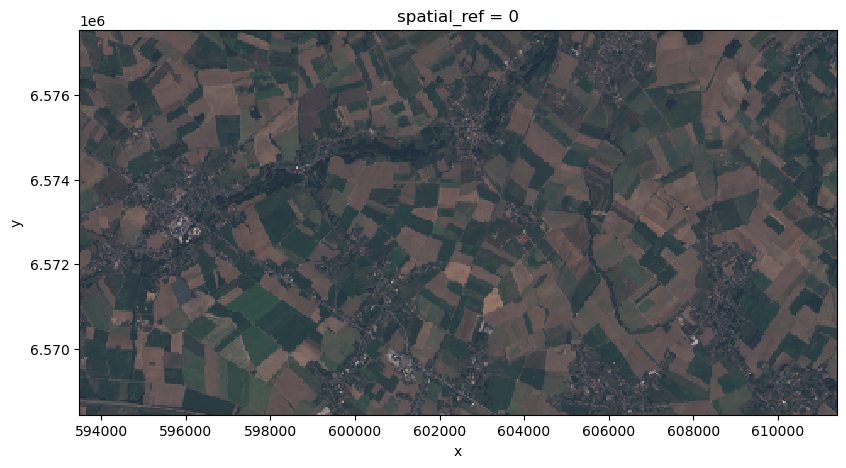

In [5]:
ax = herstappe.plot.imshow(figsize=(12, 5))
ax.axes.set_aspect('equal')

We can make the dimension information more useful by renaming the labels of the 'band' dimension:

In [6]:
# This assigns values to the "band" axis (e.g., this would like changing the x-ticks)
herstappe = herstappe.assign_coords(band=("band", ["red", "green", "blue"]))
herstappe

<xarray.DataArray (band: 3, y: 227, x: 447)>
[304407 values with dtype=float32]
Coordinates:
  * band         (band) <U5 'red' 'green' 'blue'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

Or just rename the coordinate names itself:

In [7]:
# This is like changing the xlabels
herstappe.rename({"x": "easting", "y": "northing"})

<xarray.DataArray (band: 3, northing: 227, easting: 447)>
[304407 values with dtype=float32]
Coordinates:
  * band         (band) <U5 'red' 'green' 'blue'
  * easting      (easting) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * northing     (northing) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

These __dimension coordinate names__ can be used to extract (slice) data making data selections very declarative:

In [8]:
# Call by name - more explicit and easier to read!
herstappe.sel(band='red')

<xarray.DataArray (y: 227, x: 447)>
[101469 values with dtype=float32]
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

In [9]:
# Note that once you have renamed the axis, calling it by the old name (or even positionally) won't work
# herstappe.sel(band = 0) <-- this won't work

# If you want to call positionally, use the following
herstappe.sel(band = herstappe.band[0])

<xarray.DataArray (y: 227, x: 447)>
[101469 values with dtype=float32]
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

The data type of this `xarray.DataArray` `herstappe` is 'float32'. Xarray uses the data types provided by Numpy. More information on the data types NumPy supports is available in the [documentation](https://numpy.org/devdocs/user/basics.types.html#array-types-and-conversions-between-types).

Converting to another data type is supported by `astype()` method:

In [11]:
# Compare the below to float32 - float64 uses twice the number of bytes
# memory issues if using extraneous formatting!

# Double memory if using float64
print(herstappe.nbytes)
print(herstappe.astype('float64').nbytes)

1217628
2435256


Using xarray:

- Data stored as a NumPy arrays.
- Dimensions do have a name.
- The coordinates of each of the dimensions can represent geographical coordinates, categories, dates, ... instead of just an index.

<div class="alert alert-info" style="font-size:120%">

**REMEMBER**: <br>

The [`xarray` package](xarray.pydata.org/en/stable/) introduces __labels__ in the form of dimensions, coordinates and attributes on top of raw NumPy-like arrays. Xarray is inspired by and borrows heavily from Pandas.    

</div>

## Selecting data

Xarray’s labels make working with multidimensional data much easier:

In [12]:
herstappe = xr.open_dataarray(herstappe_file, engine="rasterio")
herstappe = herstappe.assign_coords(band=("band", ["red", "green", "blue"]))

In [13]:
herstappe = rxr.open_rasterio(herstappe_file)
herstappe = herstappe.assign_coords(band=("band", ["red", "green", "blue"]))

We could use the Numpy style of data slicing:

In [14]:
# note that this works because the bands are the 'first' dimension
herstappe[0]

<xarray.DataArray (y: 227, x: 447)>
[101469 values with dtype=float32]
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

However, it is often much more powerful to use xarray’s `.sel()` method to use label-based indexing, making the selection more declarative:

In [15]:
herstappe.sel(band="red")

<xarray.DataArray (y: 227, x: 447)>
[101469 values with dtype=float32]
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

We can select a specific set of coordinate values as a __list__ and take the value that is most near to the given value:

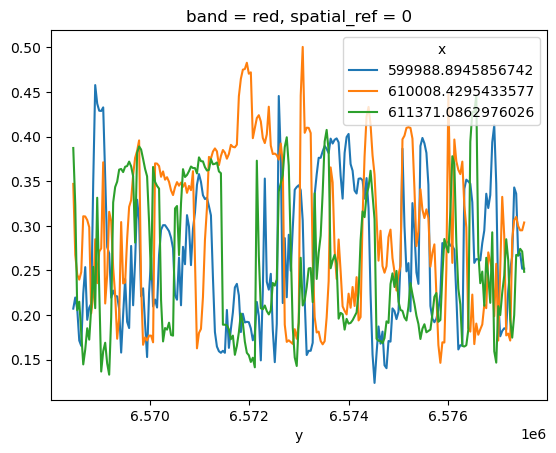

In [16]:
# Returns the reflectance of the columns at x = 600,000, etc.
# Note that this returns the SPECIFIC values at these x-values - it does not return a range of values
# Note the use of the 'hue' argument
herstappe.sel(x=[600_000, 610_000, 620_000], method="nearest").sel(band="red").plot.line(hue="x");

Sometimes, a specific range is required. The `.sel()` method also supports __slicing__, so we can select the green band and slice a subset of the data along the x direction:

C:\Users\tranq\AppData\Local\Temp\ipykernel_3276\3578035239.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.axes.set_xticklabels(ax.axes.get_xticklabels(), rotation = 45)


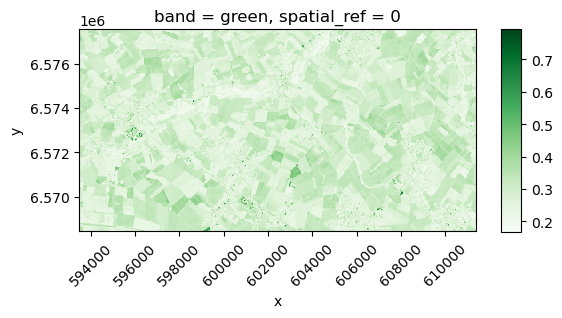

In [17]:
# If you want to select a range of values, you need to use slice
ax = herstappe.sel(x=slice(580_000, 620_000), band="green").plot.imshow(cmap="Greens",
                                                                        # Use cbar_kwargs to adjust cbar size and position
                                                                        cbar_kwargs={"location": "right", 
                                                                                    "shrink": 0.55, 
                                                                                    "aspect": 10})
ax.axes.set_xticklabels(ax.axes.get_xticklabels(), rotation = 45)
ax.axes.set_aspect('equal');

The __positional indexing__ as you would do with the underlying Numpy array is still possible as well:

In [18]:
# recall that numpy indexing is as follows start:stop:step_size
herstappe[0, 100:200:5, 100:200:5]

<xarray.DataArray (y: 20, x: 20)>
[400 values with dtype=float32]
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.975e+05 5.977e+05 ... 6.011e+05 6.013e+05
  * y            (y) float64 6.574e+06 6.573e+06 6.573e+06 ... 6.57e+06 6.57e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

In [19]:
herstappe[0, 100:200:10, 100:200:10]

<xarray.DataArray (y: 10, x: 10)>
[100 values with dtype=float32]
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.975e+05 5.979e+05 ... 6.007e+05 6.011e+05
  * y            (y) float64 6.574e+06 6.573e+06 6.573e+06 ... 6.57e+06 6.57e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

Use a __condition__ to select data, also called fancy indexing or boolean indexing:

In [20]:
herstappe > 0.3

<xarray.DataArray (band: 3, y: 227, x: 447)>
array([[[ True, False, False, ..., False, False, False],
        [ True, False, False, ..., False, False, False],
        [ True, False, False, ..., False, False, False],
        ...,
        [ True,  True,  True, ...,  True,  True, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True, False, False, ..., False, False, False],
        [ True,  True, False, ..., False, False, False],
        [ True, False, False, ..., False,  True, False],
        ...,
        [ True,  True,  True, ...,  True,  True, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True, False, False, ..., False, False, False],
        [ True,  True, False, ..., False, False,  True],
        [ True, False, False, ...,  True,  True, False],
        ...,
        [ True,  True,  True, ...,  True,  True, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]])
Coordinates:
  * band         (band) <U5 'red' 'green' 'blue'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0

**However, with xarray we cannot use a mask like this to directly filter the array or assign new values.**

One typical use case for raster data is where you want to apply a mask to the data and set those values to some "NODATA" value. For plotting, this can for example be `np.nan`, and for this we can use the `where()` method:

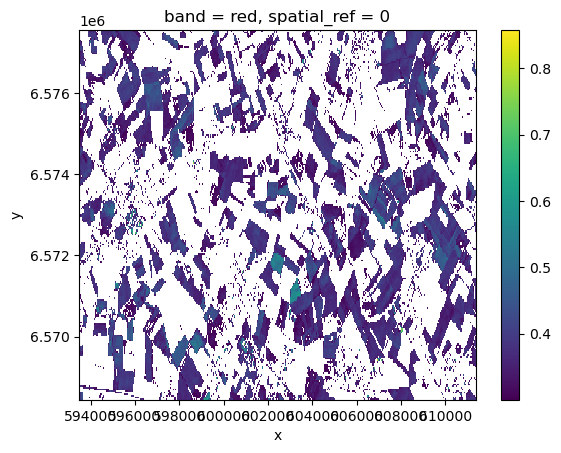

In [21]:
# note that this turned all pixels < 0.3 into np.nan
herstappe.where(herstappe > 0.3).sel(band="red").plot.imshow()

In [ ]:
# Recall that xarray.where is very unusual in that you set what you want the .where(condition, value if condition is false)
# by default, value if condition is False is np.nan

# It will return the original value in cases where condition is True

### Let's practice!

We'll again look at some Sentinel GeoTiff data, this time from the region of the City of Ghent:

<div class="alert alert-success">

**EXERCISE 1**:

* Read in the file `./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff` with xarray and assign the data to a new variable `tc_data`.  
* Check the data type of `tc_data` and compare it with the information in the file metadata using `gdalinfo` command (GDAL CLI).
* Use the `mask_and_scale` parameter in the reader function to make sure the data type of `tc_data` is the same as the raw data.     
    
<details><summary>Hints</summary>

* To run a command from the command line, add the `!` in front e.g. `!gdalinfo FILENAME`   

</details>
    
</div>

In [27]:
tc_data = rxr.open_rasterio('data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff')

tc_data

<xarray.DataArray (band: 3, y: 317, x: 625)>
[594375 values with dtype=uint16]
Coordinates:
  * band         (band) int32 1 2 3
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              65535
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               band_data

In [28]:
type(tc_data.dtype)

numpy.dtype[uint16]

In [32]:
tc_data = xr.open_dataarray('data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff')

type(tc_data.dtype)

numpy.dtype[float32]

In [33]:
tc_data = xr.open_dataarray('data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff', mask_and_scale=False)

type(tc_data.dtype)

numpy.dtype[uint16]

In [26]:
!gdalinfo -mm data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff

Driver: GTiff/GeoTIFF
Files: data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff
Size is 625, 317
Coordinate System is:
PROJCRS["WGS 84 / Pseudo-Mercator",
    BASEGEOGCRS["WGS 84",
        ENSEMBLE["World Geodetic System 1984 ensemble",
            MEMBER["World Geodetic System 1984 (Transit)"],
            MEMBER["World Geodetic System 1984 (G730)"],
            MEMBER["World Geodetic System 1984 (G873)"],
            MEMBER["World Geodetic System 1984 (G1150)"],
            MEMBER["World Geodetic System 1984 (G1674)"],
            MEMBER["World Geodetic System 1984 (G1762)"],
            MEMBER["World Geodetic System 1984 (G2139)"],
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]],
            ENSEMBLEACCURACY[2.0]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["Popular Visualisation Pseudo-Mercator",
        METHOD["Popular Visualisation Pseudo Mercator"

In [67]:
# %load _solutions/11-xarray-intro1.py

# Interesting - seems that open_dataarray coerces to float32, while open_rasterio retains uint16
tc_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff", engine="rasterio")
tc_data.dtype

dtype('float32')

In [ ]:
# %load _solutions/11-xarray-intro2.py
!gdalinfo ./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff

In [65]:
# %load _solutions/11-xarray-intro3.py
tc_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff", 
                            engine="rasterio", mask_and_scale=False)
tc_data.dtype

dtype('uint16')

<div class="alert alert-info" style="font-size:100%">

**Remember**: <br>

The `mask_and_scale` parameter is [by default `True`](https://docs.xarray.dev/en/stable/generated/xarray.open_dataarray.html) in xarray for the different engines. This might lead to unwanted data type conversions when the 'nodata' is not properly included in the raw data file. Make sure to check the data types.

</div>

<div class="alert alert-success">

**EXERCISE 2**:

* Read in the file `./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff` with xarray in the original raw data dtype and assign the data to a new variable `tc_data`.  
* Inspect the display of `tc_data`. What are the different dimensions of the array? 
* Select only the *second* layer of `tc_data` and assign the output to a new variable `tc_g`.
* Plot the second (green) layer.
* Create a new array with each of the elements in the `tc_g` array with a value above 15000 set to a new value of 65535.
    
<details><summary>Hints</summary>

* Use the `mask_and_scale` parameter in the reader function to make sure the data type of tc_data is the same as the raw data.
* To select a specific subset for a certain dimension of a DataArray, use the `.sel()` method. The argument name to use is the name of the dimension.
* You can mask an array and set the masked values to another value with the `.where()` method. Check the help of the method for information on the keyword arguments.    

</details>
    
</div>

In [34]:
tc_data = xr.open_dataarray(
    'data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff', 
    engine = 'rasterio', 
    mask_and_scale=False
)

tc_data.shape

(3, 317, 625)

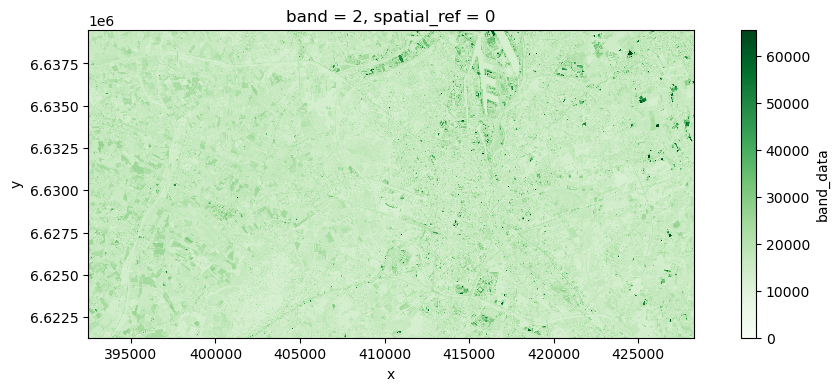

In [44]:
tc_g = tc_data.sel(band = 2)

import matplotlib.pyplot as plt

f, ax = plt.subplots(figsize = (12,4))
tc_g.plot(ax = ax, cmap = "Greens")
ax.set_aspect('equal')

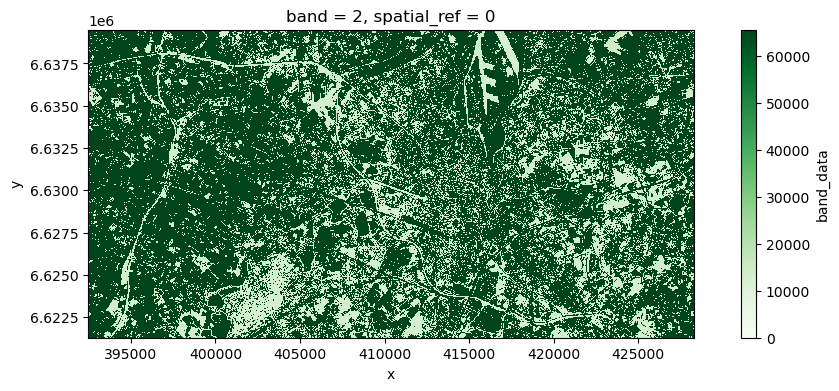

In [49]:
tc_g_clipped = tc_g.where(tc_g < 15_000, 65535)

f, ax = plt.subplots(figsize = (12,4))
tc_g_clipped.plot(ax = ax, cmap = "Greens")
ax.set_aspect('equal')

In [89]:
tc_data = rxr.open_rasterio('data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff')

tc_data.shape

(3, 317, 625)

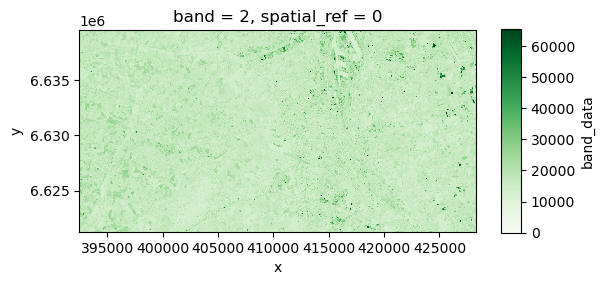

In [90]:
ax = tc_data[1].plot.imshow(cmap="Greens",
                            # Use cbar_kwargs to adjust cbar size and position
                            cbar_kwargs={"location": "right", 
                                         "shrink": 0.55, 
                                         "aspect": 10})
ax.axes.set_aspect('equal')

In [91]:
tc_g = tc_data[1]

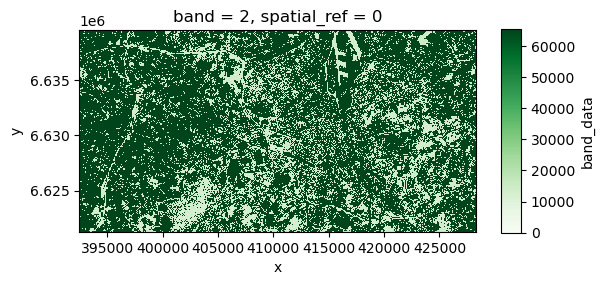

In [92]:
tc_sat = tc_g.where(tc_g <= 15000, 65535)

ax = tc_sat.plot.imshow(cmap="Greens",
                            # Use cbar_kwargs to adjust cbar size and position
                            cbar_kwargs={"location": "right", 
                                         "shrink": 0.55, 
                                         "aspect": 10})
ax.axes.set_aspect('equal')

In [93]:
tc_sat.dtype

dtype('uint16')

In [83]:
# %load _solutions/11-xarray-intro4.py
tc_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff", 
                            engine="rasterio", mask_and_scale=False)

In [84]:
# %load _solutions/11-xarray-intro5.py
# Get the green channel
tc_g = tc_data.sel(band=2)
tc_g

<xarray.DataArray 'band_data' (y: 317, x: 625)>
[198125 values with dtype=uint16]
Coordinates:
    band         int32 2
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 ...
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              65535
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               band_data

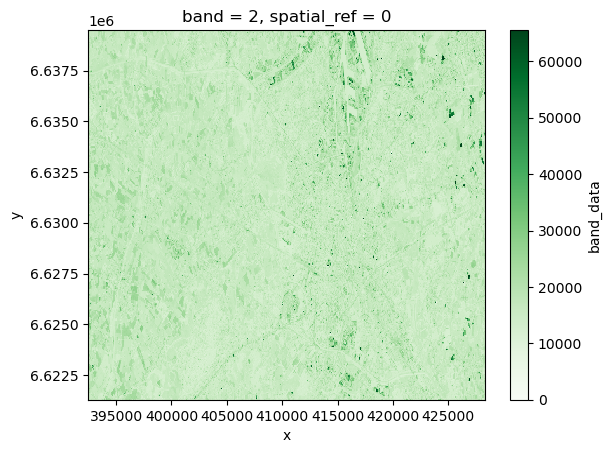

In [85]:
# %load _solutions/11-xarray-intro6.py
# Plot the green channel
tc_g.plot.imshow(cmap="Greens")

In [86]:
# %load _solutions/11-xarray-intro7.py
# Convert all values above 15000
tc_g.where(tc_g < 15000, 65535)

<xarray.DataArray 'band_data' (y: 317, x: 625)>
array([[65535, 65535, 65535, ..., 65535, 65535, 65535],
       [65535, 65535, 65535, ..., 65535, 14221, 13779],
       [65535, 65535, 65535, ..., 14631, 65535, 65535],
       ...,
       [65535, 65535, 65535, ..., 65535, 65535, 65535],
       [65535, 65535, 65535, ..., 14516, 65535, 65535],
       [65535, 65535, 65535, ..., 13844, 65535, 65535]], dtype=uint16)
Coordinates:
    band         int32 2
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              65535
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               band_data

<div class="alert alert-success">

**EXERCISE 3**:

Subsample the ndarray `tc_data` by taking only the one out of each 5 data points for all layers at the same time. Use _positional indexing_ to subsample the data.
    
(Be aware that this is a naive resampling implementation for educational purposes only). 
    
<details><summary>Hints</summary>

* Slicing in Numpy is similar to Python lists, but in multiple dimensions, e.g. for 2 dimensions `my_array[start:end:step-size, start:end:step-size]`.
* When selecting all elements in a given dimension, just use a single colon, e.g. `my_array[:]`. When slicing from `start` to `end` of an array, leave these values empty, e.g. `my_array[::step-size]`.
* The result should still be a 3-D array with 3 elements in the first dimension.

</details>   
    
</div>

In [50]:
# should be correct
tc_data[:, ::5, ::5]

<xarray.DataArray 'band_data' (band: 3, y: 64, x: 125)>
[24000 values with dtype=uint16]
Coordinates:
  * band         (band) int32 1 2 3
  * x            (x) float64 3.925e+05 3.928e+05 ... 4.278e+05 4.28e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.622e+06 6.621e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              65535
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               band_data

In [ ]:
# %load _solutions/11-xarray-intro8.py
tc_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff", 
                            engine="rasterio", mask_and_scale=False)

In [ ]:
# %load _solutions/11-xarray-intro9.py
# subsample the data
tc_data[:, ::5, ::5].shape

<div class="alert alert-success">

**EXERCISE 4**:

Elements with the value `65535` do represent 'Not a Number' (NaN) values. However, NumPy does not support NaN values for integer data, so we'll convert to float first as data type. After reading in the data set `./data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff` (assign data to variable `b4_data`):
    
* Count the number of elements that are equal to `65535`
* Convert the data type to `float`, assign the result to  a new variable `b4_data_f` (numpy does not support NaN for integers).
* Assign NaN (`np.nan`) value to each of the elements of `b4_data_f` equal to `65535`
* Count the number of NaN values in the `b4_data_f` data
* Make a histogram of both the `b4_data` and `b4_data_f` data. Can you spot the difference?
    
<details><summary>Hints</summary>    

* `np.nan` represents _Not a Number (NaN)_ in Numpy. You can mask an array with np.nan values using the `where()`method
* `np.sum` will by default sum all of the elements of the input array and can also count boolean values (True = 1 and False = 0), resulting from a conditional expression. 
* To test if a value is a NaN, numpy provides `np.isnan(...)` which results in an element-wise check returning boolean values.
* Check the help of the `plt.hist` command to find out more about the `bins` and the `log` arguments.

</details>
    
   
</div>

In [150]:
b4_data = rxr.open_rasterio('data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff')

b4_data

<xarray.DataArray (band: 1, y: 317, x: 625)>
[198125 values with dtype=uint16]
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

In [152]:
(b4_data.values == 65535).sum()

30

In [138]:
# currently uint16
print(b4_data.dtype)

# convert to float
b4_data_float = b4_data.astype('float')

b4_data_float

uint16


<xarray.DataArray (band: 1, y: 317, x: 625)>
array([[[ 5125.,  5793., 11475., ...,  6776.,  6816.,  5662.],
        [ 6698.,  4974.,  5603., ...,  4797.,  4306.,  4293.],
        [ 6626.,  5243.,  5046., ...,  4509.,  4804.,  4620.],
        ...,
        [ 4764.,  4863.,  4463., ...,  9234.,  6606.,  4476.],
        [ 4607.,  4555.,  4404., ...,  4810.,  5833.,  3926.],
        [ 4627.,  4902.,  4745., ...,  3781.,  4430.,  5439.]]])
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

In [139]:
# Recall the weirdness of xarray where
b4_data_float = b4_data_float.where(b4_data != 65535)

b4_data_float

<xarray.DataArray (band: 1, y: 317, x: 625)>
array([[[ 5125.,  5793., 11475., ...,  6776.,  6816.,  5662.],
        [ 6698.,  4974.,  5603., ...,  4797.,  4306.,  4293.],
        [ 6626.,  5243.,  5046., ...,  4509.,  4804.,  4620.],
        ...,
        [ 4764.,  4863.,  4463., ...,  9234.,  6606.,  4476.],
        [ 4607.,  4555.,  4404., ...,  4810.,  5833.,  3926.],
        [ 4627.,  4902.,  4745., ...,  3781.,  4430.,  5439.]]])
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

In [140]:
# Reveals that there are 30 null pixels
np.isnan(b4_data_float.values).sum()

30

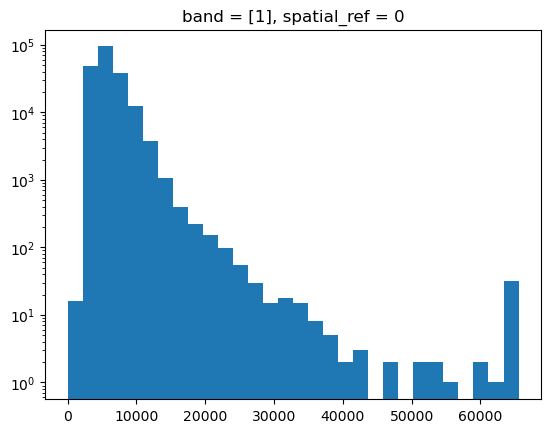

In [147]:
b4_data.plot.hist(bins=30, log=True);

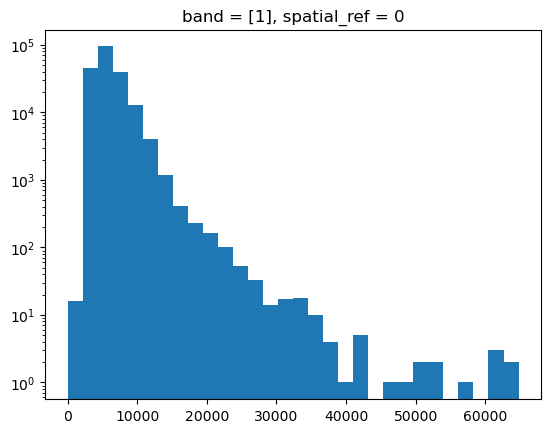

In [148]:
b4_data_float.plot.hist(bins=30, log=True);

In [144]:
b4_data_float.max()

<xarray.DataArray ()>
array(64775.)
Coordinates:
    spatial_ref  int32 0

In [112]:
# %load _solutions/11-xarray-intro10.py
# They loaded the wrong file lmao, my way is correct
b4_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff", 
                            engine="rasterio", mask_and_scale=False)

In [114]:
# %load _solutions/11-xarray-intro11.py
import numpy as np

# Count the number of cells with value 65535
np.sum(b4_data == 65535).values

array(103)

In [115]:
# %load _solutions/11-xarray-intro12.py
# Convert to float and make 65535 equal to Nan
b4_data_f = b4_data.astype(float)
b4_data_f = b4_data_f.where(b4_data != 65535)

In [116]:
# %load _solutions/11-xarray-intro13.py
# Count the number of cells with value 0
np.sum(np.isnan(b4_data_f)).values

array(103)

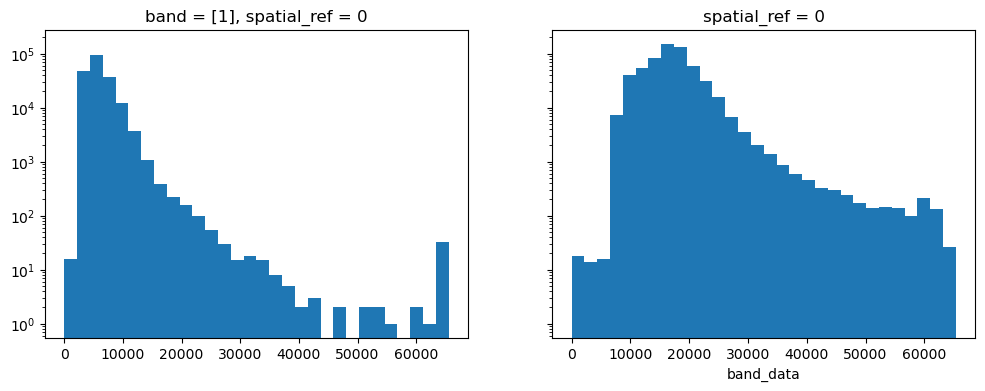

In [146]:
# %load _solutions/11-xarray-intro14.py
import matplotlib.pyplot as plt

# Create the histogram plots
fig, (ax0, ax1) = plt.subplots(1, 2, sharey=True, figsize=(12, 4))
b4_data.plot.hist(bins=30, log=True, ax=ax0)
b4_data_f.plot.hist(bins=30, log=True, ax=ax1);

This is what the `mask_and_scale` option also does: it reads the nodata value from the metadata in the tiff file and uses this to mask the no-data value with a Nan value.

## Plotting

We already used `.plot.imshow` and `.plot.line` in the previous section and exercise. Similar to Pandas, `xarray` has a `plot` method, which can be used for different plot types.

In [51]:
xr_array = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_B0408.tiff", 
                             engine="rasterio")
xr_array = xr_array.assign_coords(band=("band", ["b4", "b8"]))

In [153]:
xr_array = rxr.open_rasterio("./data/gent/raster/2020-09-17_Sentinel_2_L1C_B0408.tiff")
xr_array = xr_array.assign_coords(band=("band", ["b4", "b8"]))

It supports both 2 dimensional (e.g. line) as 3 (e.g. imshow, pcolormesh) dimensional plots. When just using `plot`, xarray will do a _best guess_ on how to plot the data. However being explicit `plot.line`, `plot.imshow`, `plot.pcolormesh`, `plot.scatter`,...  gives you more control.

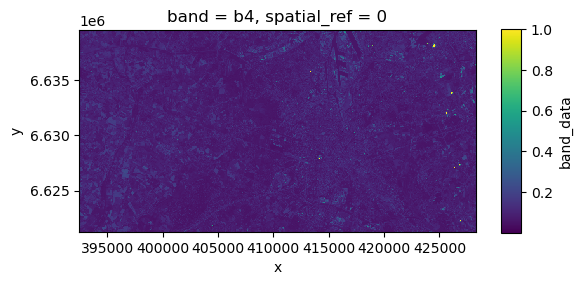

In [52]:
ax = xr_array.sel(band="b4").plot(# Use cbar_kwargs to adjust cbar size and position
                            cbar_kwargs={"location": "right", 
                                         "shrink": 0.55, 
                                         "aspect": 10})
ax.axes.set_aspect('equal');  # add .line() -> ValueError: For 2D inputs, please specify either hue, x or y.

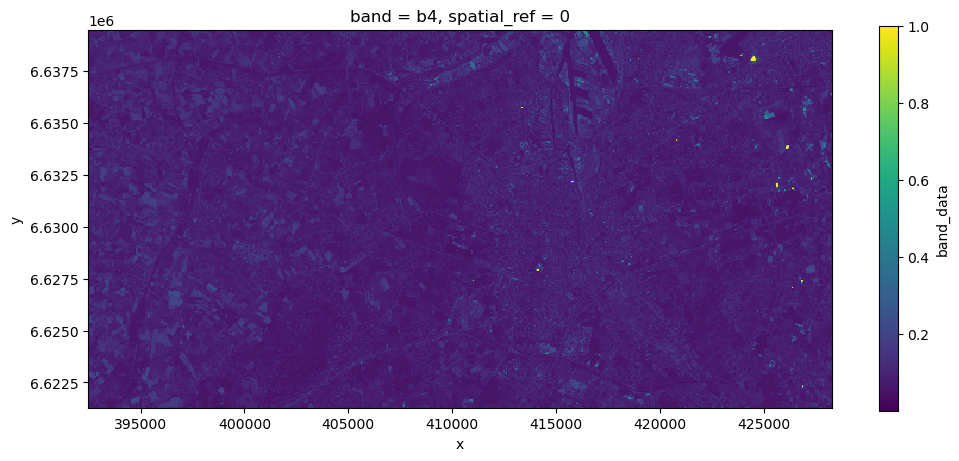

In [54]:
# Robust automatically removes outliers from the plot for better visualization (default is True)
# Removing robust allows you to see all data
ax = xr_array.sel(band="b4").plot(robust = False, figsize = (12,5))
ax.axes.set_aspect('equal');

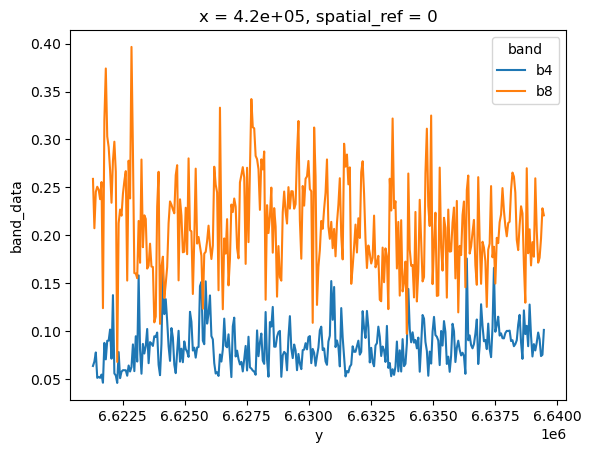

In [55]:
xr_array.sel(x=420000, method="nearest").plot.line(hue="band");

"facetting" splits the data in subplots according to a dimension, e.g. `band`

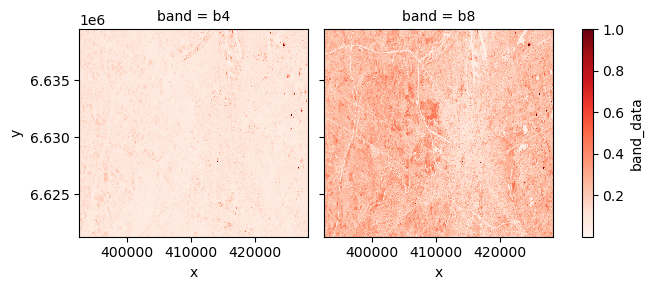

In [56]:
xr_array.plot.imshow(col="band", cmap="Reds");

Facetting also works for line plots:

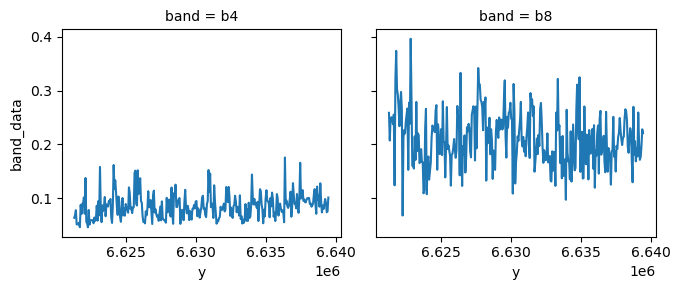

In [57]:
xr_array.sel(x=420000, method="nearest").plot.line(col="band");  # row="band"

Use the `robust` option when there is a lack of visual difference. This will use the 2nd and 98th percentiles of the data to compute the color limits. The arrows on the color bar indicate that the colors include data points outside the bounds.

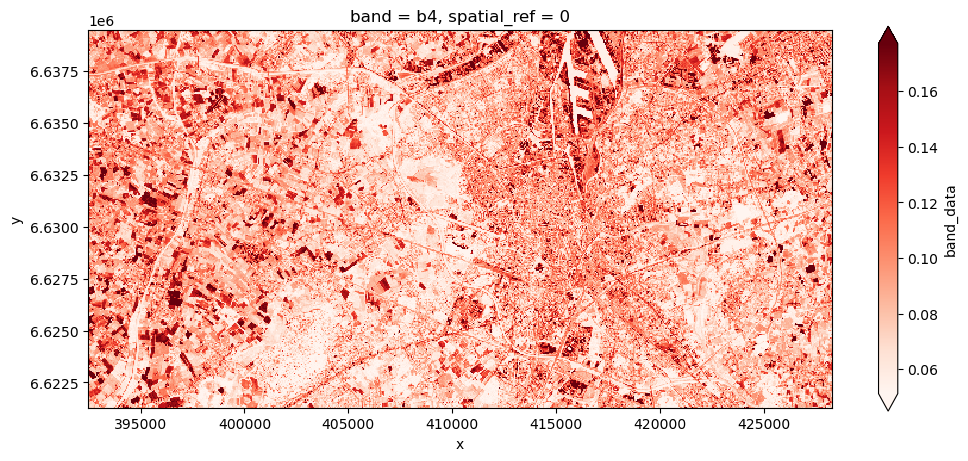

In [58]:
ax = xr_array.sel(band="b4").plot(cmap="Reds", robust=True, figsize=(12, 5))  # use False as well
ax.axes.set_aspect('equal')

In case you want to show the output with a __discrete colormap__, one can define a [set of levels to split the colormap](http://xarray.pydata.org/en/stable/user-guide/plotting.html#discrete-colormaps) on:

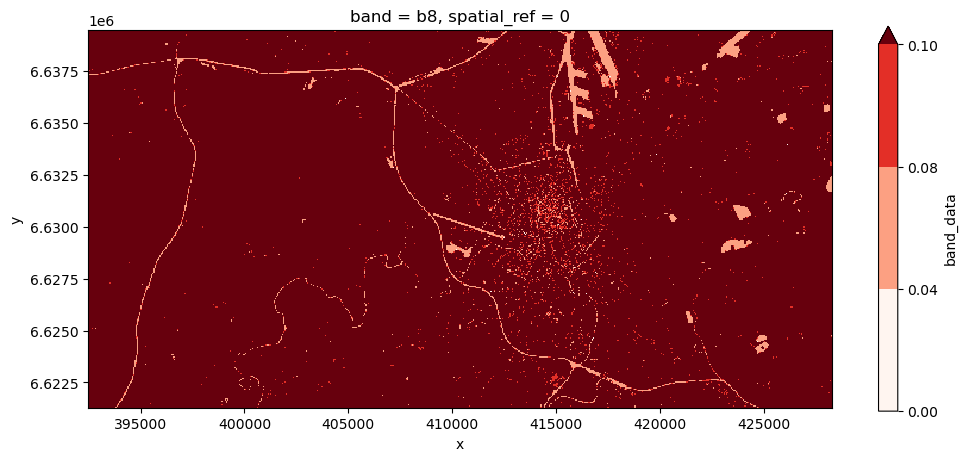

In [59]:
# oh this is pretty cool - automatically updates the cbar as well, which is nice
ax = xr_array.sel(band="b8").plot(cmap="Reds", levels=[0, 0.04, 0.08, 0.1], figsize=(12, 5))  # plot without these levels
ax.axes.set_aspect('equal')

For more control, defining the `Figure` and `Axes` Matplotlib object first provides more flexibility in terms of further adjustments. One can pass an `axes` object to an xarray `.plot` method in order to link the output:

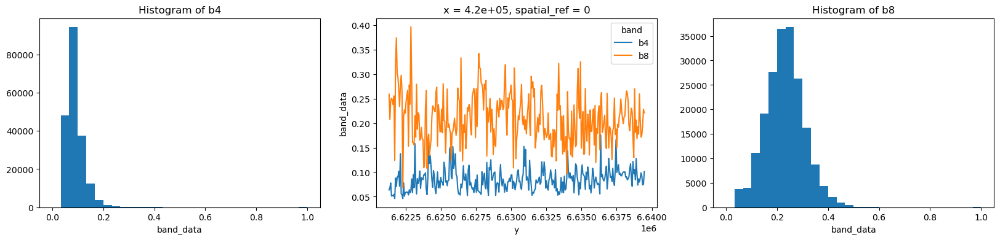

In [60]:
fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20, 4))

# first subplot a histogram of band 4
xr_array.sel(band="b4").plot.hist(bins=30, ax=ax0);
ax0.set_title("Histogram of b4");

# second subplot a line plot at given x coordinate
xr_array.sel(x=420_000, method="nearest").plot.line(hue="band", ax=ax1);

# third subplot a histogram of band 8
xr_array.sel(band="b8").plot.hist(bins=30, ax=ax2);
ax2.set_title("Histogram of b8");

## Reductions, element-wise calculations and broadcasting

In [61]:
# herstappe = rxr.open_rasterio(herstappe_file, engine="rasterio")

herstappe = xr.open_dataarray(herstappe_file, engine = "rasterio")
herstappe = herstappe.assign_coords(band=("band", ["red", "green", "blue"]))
herstappe_red = herstappe.sel(band="red")

### Reductions

The __reductions__ (aggregations) are provided as methods and can be applied along one or more of the data dimensions.

By default, the array is reduced over all dimensions, returning a single value as a DataArray:

In [174]:
herstappe_red.mean()

<xarray.DataArray ()>
array(0.27586532, dtype=float32)
Coordinates:
    band         <U5 'red'
    spatial_ref  int32 0

In NumPy, the dimensions are called the __axis__:

In [175]:
# Average pixel value along each row
herstappe_red.mean(axis=1)

<xarray.DataArray (y: 227)>
array([0.27257997, 0.2730302 , 0.27882323, 0.28289318, 0.28358892,
       0.2827528 , 0.28218287, 0.27802128, 0.27297595, 0.27357492,
       0.2750811 , 0.27421978, 0.27253968, 0.267533  , 0.26884004,
       0.26667392, 0.26950392, 0.27182943, 0.27148938, 0.27283612,
       0.2725464 , 0.27282214, 0.2732914 , 0.2809407 , 0.28457773,
       0.28962082, 0.29109505, 0.2883283 , 0.28721252, 0.2862478 ,
       0.28497875, 0.27839935, 0.27497035, 0.27145863, 0.27309564,
       0.2773652 , 0.2777612 , 0.27870917, 0.27950057, 0.28156993,
       0.28009897, 0.2784961 , 0.28004864, 0.28016555, 0.2799614 ,
       0.28029698, 0.27859282, 0.27868232, 0.27850223, 0.28422594,
       0.2747545 , 0.27626175, 0.2782226 , 0.27482104, 0.2757511 ,
       0.27877182, 0.27805147, 0.27441725, 0.27426678, 0.2760285 ,
       0.2784206 , 0.27596644, 0.27611804, 0.2747377 , 0.2743188 ,
       0.2724491 , 0.2672086 , 0.26089823, 0.2578473 , 0.2546292 ,
       0.2492981 , 0.2499944 , 0.24945639, 0.2477114 , 0.25369686,
       0.2589916 , 0.2613322 , 0.26193288, 0.2671068 , 0.26986575,
       0.2739463 , 0.27676624, 0.27886856, 0.27532104, 0.275915  ,
       0.2746516 , 0.27479023, 0.2731057 , 0.27007213, 0.27255148,
       0.27285233, 0.26989484, 0.27013814, 0.2779396 , 0.27601507,
       0.27753636, 0.28057772, 0.2804737 , 0.28125224, 0.28297094,
...
       0.28391612, 0.28284732, 0.28177014, 0.28556767, 0.28089765,
       0.27344462, 0.27452073, 0.27802572, 0.2784575 , 0.28234118,
       0.2862209 , 0.290736  , 0.28936243, 0.2865095 , 0.28146195,
       0.28202295, 0.27974552, 0.27544856, 0.26893288, 0.26566273,
       0.2634905 , 0.2642114 , 0.27001736, 0.27205536, 0.2740498 ,
       0.28036857, 0.28384957, 0.2881885 , 0.2849536 , 0.28080592,
       0.27967507, 0.27667618, 0.2811029 , 0.27860457, 0.27888033,
       0.28203857, 0.28413534, 0.28942174, 0.2876454 , 0.28944966,
       0.2917763 , 0.28778747, 0.2874709 , 0.28477237, 0.27712303,
       0.27817672, 0.27468625, 0.2745794 , 0.27197203, 0.2717567 ,
       0.2735403 , 0.276094  , 0.274481  , 0.27807832, 0.2762254 ,
       0.2777869 , 0.27896476, 0.28867394, 0.29002458, 0.29157272,
       0.29093847, 0.2968149 , 0.29821423, 0.29791832, 0.29627797,
       0.2927662 , 0.28936523, 0.28149047, 0.2772953 , 0.27569237,
       0.27091107, 0.2602349 , 0.26218903, 0.25784284, 0.25383276,
       0.24703188, 0.24943289, 0.2481499 , 0.24555984, 0.25293064,
       0.25616834, 0.25984564, 0.2595867 , 0.2658294 , 0.25919014,
       0.25744295, 0.25550896, 0.2572332 , 0.25469968, 0.26596195,
       0.2730632 , 0.2658529 , 0.2639066 , 0.26685235, 0.27544463,
       0.28415158, 0.28765494], dtype=float32)
Coordinates:
    band         <U5 'red'
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0

But we have __dimensions with labels__, so rather than performing reductions on axes (as in NumPy), we can perform them on __dimensions__. This turns out to be convenient and declarative:

In [176]:
herstappe_red.mean(dim="x")

<xarray.DataArray (y: 227)>
array([0.27257997, 0.2730302 , 0.27882323, 0.28289318, 0.28358892,
       0.2827528 , 0.28218287, 0.27802128, 0.27297595, 0.27357492,
       0.2750811 , 0.27421978, 0.27253968, 0.267533  , 0.26884004,
       0.26667392, 0.26950392, 0.27182943, 0.27148938, 0.27283612,
       0.2725464 , 0.27282214, 0.2732914 , 0.2809407 , 0.28457773,
       0.28962082, 0.29109505, 0.2883283 , 0.28721252, 0.2862478 ,
       0.28497875, 0.27839935, 0.27497035, 0.27145863, 0.27309564,
       0.2773652 , 0.2777612 , 0.27870917, 0.27950057, 0.28156993,
       0.28009897, 0.2784961 , 0.28004864, 0.28016555, 0.2799614 ,
       0.28029698, 0.27859282, 0.27868232, 0.27850223, 0.28422594,
       0.2747545 , 0.27626175, 0.2782226 , 0.27482104, 0.2757511 ,
       0.27877182, 0.27805147, 0.27441725, 0.27426678, 0.2760285 ,
       0.2784206 , 0.27596644, 0.27611804, 0.2747377 , 0.2743188 ,
       0.2724491 , 0.2672086 , 0.26089823, 0.2578473 , 0.2546292 ,
       0.2492981 , 0.2499944 , 0.24945639, 0.2477114 , 0.25369686,
       0.2589916 , 0.2613322 , 0.26193288, 0.2671068 , 0.26986575,
       0.2739463 , 0.27676624, 0.27886856, 0.27532104, 0.275915  ,
       0.2746516 , 0.27479023, 0.2731057 , 0.27007213, 0.27255148,
       0.27285233, 0.26989484, 0.27013814, 0.2779396 , 0.27601507,
       0.27753636, 0.28057772, 0.2804737 , 0.28125224, 0.28297094,
...
       0.28391612, 0.28284732, 0.28177014, 0.28556767, 0.28089765,
       0.27344462, 0.27452073, 0.27802572, 0.2784575 , 0.28234118,
       0.2862209 , 0.290736  , 0.28936243, 0.2865095 , 0.28146195,
       0.28202295, 0.27974552, 0.27544856, 0.26893288, 0.26566273,
       0.2634905 , 0.2642114 , 0.27001736, 0.27205536, 0.2740498 ,
       0.28036857, 0.28384957, 0.2881885 , 0.2849536 , 0.28080592,
       0.27967507, 0.27667618, 0.2811029 , 0.27860457, 0.27888033,
       0.28203857, 0.28413534, 0.28942174, 0.2876454 , 0.28944966,
       0.2917763 , 0.28778747, 0.2874709 , 0.28477237, 0.27712303,
       0.27817672, 0.27468625, 0.2745794 , 0.27197203, 0.2717567 ,
       0.2735403 , 0.276094  , 0.274481  , 0.27807832, 0.2762254 ,
       0.2777869 , 0.27896476, 0.28867394, 0.29002458, 0.29157272,
       0.29093847, 0.2968149 , 0.29821423, 0.29791832, 0.29627797,
       0.2927662 , 0.28936523, 0.28149047, 0.2772953 , 0.27569237,
       0.27091107, 0.2602349 , 0.26218903, 0.25784284, 0.25383276,
       0.24703188, 0.24943289, 0.2481499 , 0.24555984, 0.25293064,
       0.25616834, 0.25984564, 0.2595867 , 0.2658294 , 0.25919014,
       0.25744295, 0.25550896, 0.2572332 , 0.25469968, 0.26596195,
       0.2730632 , 0.2658529 , 0.2639066 , 0.26685235, 0.27544463,
       0.28415158, 0.28765494], dtype=float32)
Coordinates:
    band         <U5 'red'
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0

Calculate the mean values for each of the bands separately:

In [177]:
# Average pixel value of each band
herstappe.mean(dim=["x", "y"])  # read as: 'take the mean over the dimensions x and y combined'

<xarray.DataArray (band: 3)>
array([0.27586532, 0.28978536, 0.29871756], dtype=float32)
Coordinates:
  * band         (band) <U5 'red' 'green' 'blue'
    spatial_ref  int32 0

Or some quantiles:

In [178]:
herstappe.quantile([0.1, 0.5, 0.9], dim=["x", "y"])

<xarray.DataArray (quantile: 3, band: 3)>
array([[0.17125   , 0.23675001, 0.25999999],
       [0.2615    , 0.28600001, 0.29475001],
       [0.39274999, 0.34474999, 0.34024999]])
Coordinates:
  * band      (band) <U5 'red' 'green' 'blue'
  * quantile  (quantile) float64 0.1 0.5 0.9

### Element-wise computations

The __for each element__ is crucial for NumPy and Xarray. The typical answer in programming would be a `for`-loop, but Numpy is optimized to do these calculations __element-wise__ (i.e. for all elements together):

In [179]:
dummy = np.arange(1, 10)
dummy

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [180]:
dummy*10

array([10, 20, 30, 40, 50, 60, 70, 80, 90])

Instead of:

In [181]:
[el*20 for el in dummy]

[20, 40, 60, 80, 100, 120, 140, 160, 180]

Numpy provides most of the familiar arithmetic operators to apply on an element-by-element basis:

In [182]:
np.exp(dummy), np.sin(dummy), dummy**2, np.log(dummy)

(array([2.71828183e+00, 7.38905610e+00, 2.00855369e+01, 5.45981500e+01,
        1.48413159e+02, 4.03428793e+02, 1.09663316e+03, 2.98095799e+03,
        8.10308393e+03]),
 array([ 0.84147098,  0.90929743,  0.14112001, -0.7568025 , -0.95892427,
        -0.2794155 ,  0.6569866 ,  0.98935825,  0.41211849]),
 array([ 1,  4,  9, 16, 25, 36, 49, 64, 81]),
 array([0.        , 0.69314718, 1.09861229, 1.38629436, 1.60943791,
        1.79175947, 1.94591015, 2.07944154, 2.19722458]))

Xarray works seamlessly with those arithmetic operators and numpy array functions.

In [183]:
herstappe_red * 10.

<xarray.DataArray (y: 227, x: 447)>
array([[3.375    , 2.1950002, 1.7675   , ..., 1.67     , 1.7624999,
        2.4850001],
       [3.62     , 2.9524999, 2.22     , ..., 1.97     , 2.1275   ,
        2.7125   ],
       [3.0774999, 2.6425002, 2.5874999, ..., 2.7200003, 2.8975   ,
        2.7425   ],
       ...,
       [3.9175   , 3.8825   , 4.335    , ..., 3.815    , 3.1349998,
        2.055    ],
       [3.8625   , 4.0474997, 4.2124996, ..., 3.9724998, 3.875    ,
        3.2350001],
       [3.9050002, 4.0375   , 4.1775   , ..., 3.8600001, 3.88     ,
        3.8725   ]], dtype=float32)
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0

In [184]:
np.log(herstappe_red)

<xarray.DataArray (y: 227, x: 447)>
array([[-1.0861897 , -1.5164031 , -1.733019  , ..., -1.7897615 ,
        -1.7358519 , -1.3923124 ],
       [-1.0161111 , -1.2199328 , -1.5050778 , ..., -1.6245515 ,
        -1.5476375 , -1.3047143 ],
       [-1.1784675 , -1.3308597 , -1.351893  , ..., -1.3019532 ,
        -1.2387367 , -1.2937152 ],
       ...,
       [-0.9371314 , -0.94610584, -0.8358635 , ..., -0.96364444,
        -1.159956  , -1.5823092 ],
       [-0.95127046, -0.9044857 , -0.86452883, ..., -0.9231895 ,
        -0.9480395 , -1.1285561 ],
       [-0.9403273 , -0.9069594 , -0.8728721 , ..., -0.9519179 ,
        -0.9467499 , -0.9486848 ]], dtype=float32)
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

We can combine multiple xarray arrays in arithemetic operations:

In [185]:
herstappe.sel(band="red") - herstappe.sel(band="green")

<xarray.DataArray (y: 227, x: 447)>
array([[ 0.02650002, -0.03299999, -0.06224999, ..., -0.05825001,
        -0.05525   ,  0.00075001],
       [ 0.01349998, -0.01675001, -0.03525001, ..., -0.03925   ,
        -0.04200001, -0.01874998],
       [-0.00600001, -0.01349998, -0.01899999, ..., -0.01525   ,
        -0.01499999,  0.0045    ],
       ...,
       [ 0.04975   ,  0.0465    ,  0.06774998, ...,  0.04425001,
         0.00424999, -0.04525   ],
       [ 0.044     ,  0.05824998,  0.06449997, ...,  0.05574998,
         0.04949999,  0.00875002],
       [ 0.05000001,  0.053     ,  0.05849999, ...,  0.04975   ,
         0.04700002,  0.03825   ]], dtype=float32)
Coordinates:
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0

### Broadcasting

When we combine arrays with different shapes during arithmetic operations, NumPy and Xarray apply a set of __broadcoasting__ rules and the smaller array is _broadcast_ across the larger array so that they have compatible shapes. 

Perfoming an operation on arrays with different coordinates will result in automatic broadcasting:

In [186]:
herstappe.x.shape, herstappe_red.shape

((447,), (227, 447))

In [187]:
herstappe_red + herstappe.x  # Note, this calculaton does not make much sense, but illustrates broadcasting

<xarray.DataArray (y: 227, x: 447)>
array([[593496.5734331 , 593536.53357293, 593576.56896276, ...,
        611291.09701794, 611331.18440777, 611371.33479761],
       [593496.59793308, 593536.60932292, 593576.61421276, ...,
        611291.12701794, 611331.22090777, 611371.35754761],
       [593496.54368308, 593536.57832294, 593576.65096275, ...,
        611291.20201796, 611331.29790778, 611371.3605476 ],
       ...,
       [593496.6276831 , 593536.70232292, 593576.82571275, ...,
        611291.31151795, 611331.32165776, 611371.29179761],
       [593496.62218308, 593536.71882292, 593576.81346274, ...,
        611291.32726794, 611331.39565776, 611371.40979761],
       [593496.6264331 , 593536.71782293, 593576.80996276, ...,
        611291.31601795, 611331.39615778, 611371.47354761]])
Coordinates:
    band         <U5 'red'
  * x            (x) float64 5.935e+05 5.935e+05 ... 6.113e+05 6.114e+05
  * y            (y) float64 6.578e+06 6.577e+06 ... 6.569e+06 6.568e+06
    spatial_ref  int32 0

<div class="alert alert-info" style="font-size:120%">

**REMEMBER**: <br>

The combination of element-wise calculations, efficient reductions and broadcasting provides NumPy and Xarray a lot of power. In general, it is a good advice to __avoid for loops__ when working with arrays.

</div>

### Let's practice!

<div class="alert alert-success">

**EXERCISE 5**:

The data set `./data/herstappe/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff` (assign to variable `herstappe_data`) has values ranging in between 0.11325, 0.8575. To improve the quality of the visualization, stretch __each of the layers individually__ to the values to the range 0. to 1. with a linear transformation: 
    
$$z_{i,scaled}=\frac{z_i-\min(z)}{\max(z)-\min(z)}$$

Make a plot of the end result and compare with a plot of the original data. 

<details><summary>Hints</summary>

* We ask to do it *"for each of the bands"*, but you don't need to do it separately for each band! Using broadcasting and element-wise operations, we can do this in one go.
* First calculate the minimum and maximum value for the bands (i.e. reducing over the other (x, y) dimensions). This should result in an 1D array of length 3.
* With those min/max arrays, you can add and subtract those from the original `herstappe_data` array to obtain the scaled data.

</details>    
    
</div>

In [62]:
herstappe_data = xr.open_dataarray("./data/herstappe/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff", 
                                   engine="rasterio")

In [188]:
herstappe_data = rxr.open_rasterio("./data/herstappe/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff")

In [ ]:
# Note that this is incorrect, as it finds the min and max of the entire image
# what you want to do is stretch using the max and min values of each individual band
herstappe_data_str = (herstappe_data - herstappe_data.min()) / (herstappe_data.max() - herstappe_data.min())

In [63]:
# Finds the min and max over each band (h_min and h_max have three different values each corresponding to the r/g/b bands)
h_min = herstappe_data.min(dim = ['x', 'y'])
h_max = herstappe_data.max(dim = ['x', 'y'])

h_min

<xarray.DataArray 'band_data' (band: 3)>
array([0.11325, 0.16725, 0.222  ], dtype=float32)
Coordinates:
  * band         (band) int32 1 2 3
    spatial_ref  int32 ...

In [64]:
# Note that in the first parentheses, the h_min is broadcast over the herstappe_data
herstappe_data_str = (herstappe_data - h_min) / (h_max - h_min)

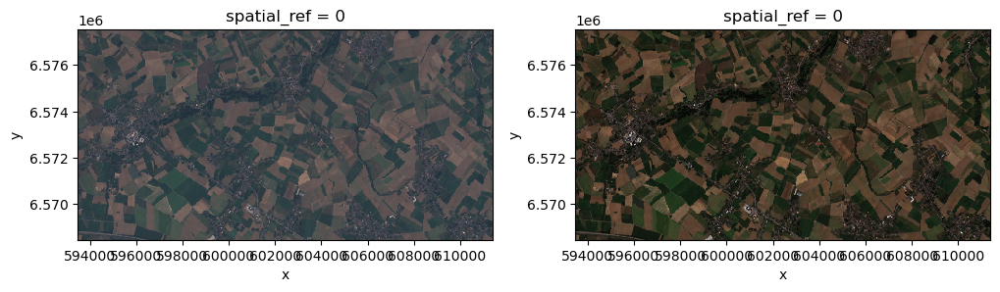

In [203]:
f, axs = plt.subplots(1,2, figsize = (12,6))

# More vivid colours as a result of stretching
herstappe_data.plot.imshow(ax = axs[0])
herstappe_data_str.plot.imshow(ax = axs[1])
axs[0].set_aspect('equal')
axs[1].set_aspect('equal');

In [198]:
# %load _solutions/11-xarray-intro15.py
# Calculate the min and max for each channel
h_min = herstappe_data.min(dim=["x", "y"])
h_max = herstappe_data.max(dim=["x", "y"])

h_min, h_max

(<xarray.DataArray (band: 3)>
 array([0.11325, 0.16725, 0.222  ], dtype=float32)
 Coordinates:
   * band         (band) int32 1 2 3
     spatial_ref  int32 0,
 <xarray.DataArray (band: 3)>
 array([0.8575 , 0.79475, 0.77725], dtype=float32)
 Coordinates:
   * band         (band) int32 1 2 3
     spatial_ref  int32 0)

In [ ]:
# %load _solutions/11-xarray-intro16.py
# Rescale the data
herstappe_rescaled = ((herstappe_data - h_min)/(h_max - h_min))

In [ ]:
# %load _solutions/11-xarray-intro17.py
# Make a plot
herstappe_rescaled.plot.imshow(figsize=(9, 5))

<div class="alert alert-success">

**EXERCISE 6**:

The true color data set for Ghent `./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff` contains 3 bands. Plotting with the `imshow` function can plot 3-D (RGB) data sets, but when running `gent.plot.imshow()`, we get an error. This is because matplotlib expects data in the range of [0..1] for floats or [0..255] for integers. 
    
The data type of this specific array `gent` is 16bit unsigned integer. Detailed info on data types is out of scope of this course, but remember that using 16bit unsigned integer, it can contain `2**16` different (all positive) integer values to represent the data range (in this case 0 to 1):

```
>>> 2**16
65536
```

In this excercise, we will convert the data to floats within the data range 0 -> 1 so we can plot it as RGB values.

- Read the data file and assign to a variable `gent`.
- Try to plot it with the `imshow()` method.
- Convert the array to a float array and call it `gent_f`.
- Now divide the array by 65536 to get our data in a [0-1] range.
- Plot the result with the `imshow()` method.

<details><summary>Hints</summary>

* To convert the data type of an array, you can use the `astype()` method. In this case you might as well opt to have the `mask_and_scale=true` as this will do the float conversion already.
* Masking out part of the data based on a condition can be done with the `where()` method.

</details>    
    
</div>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


uint16


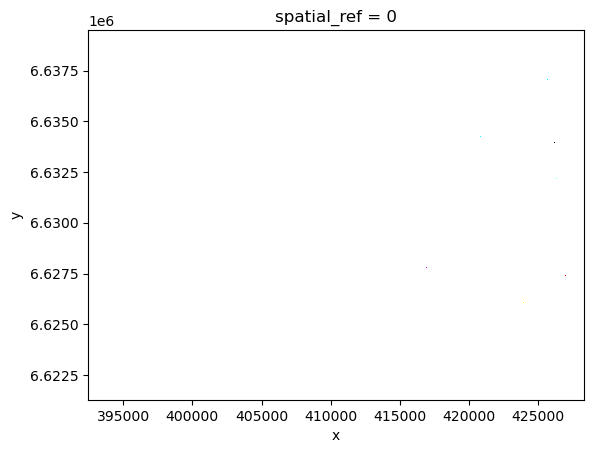

In [68]:
gent = xr.open_dataarray(
    'data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff', 
    engine = "rasterio", 
    mask_and_scale=False
)

print(gent.dtype)

gent.plot.imshow();

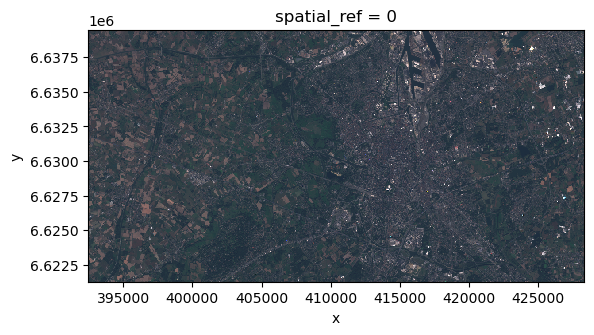

In [70]:
gent_f = gent.astype('float32')

gent_f = gent_f / 65535

ax = gent_f.plot.imshow()
ax.axes.set_aspect('equal');


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


uint16
<xarray.DataArray (band: 3)>
array([0, 0, 0], dtype=uint16)
Coordinates:
  * band         (band) int32 1 2 3
    spatial_ref  int32 0 <xarray.DataArray (band: 3)>
array([65535, 65535, 65535], dtype=uint16)
Coordinates:
  * band         (band) int32 1 2 3
    spatial_ref  int32 0


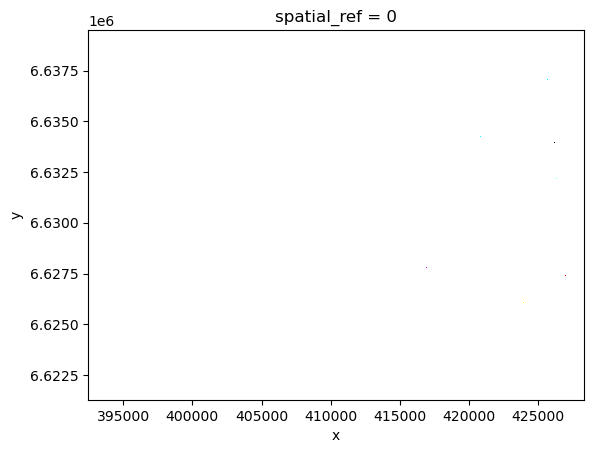

In [206]:
gent = rxr.open_rasterio('data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff')

print(gent.dtype)
print(gent.min(dim = ['x','y']), gent.max(dim = ['x','y']))

# Doesn't work since our data is 0 to 65535 and matplotlib expects 0 to 255
gent.plot.imshow()

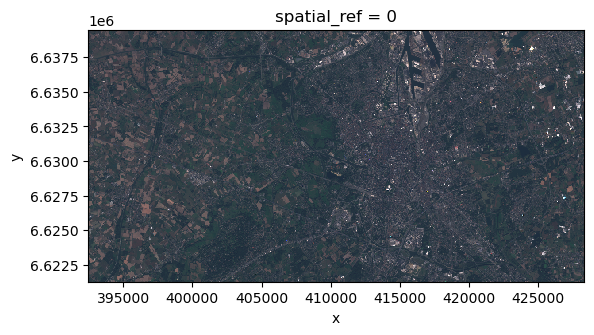

In [208]:
gent_f = gent.astype('float')

gent_f = gent_f / 65535

ax = gent_f.plot.imshow()
ax.axes.set_aspect('equal')

In [ ]:
# %load _solutions/11-xarray-intro18.py
gent = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_True_color.tiff", 
                         engine="rasterio", mask_and_scale=False)
gent

In [ ]:
# %load _solutions/11-xarray-intro19.py
gent.plot.imshow()

In [ ]:
# %load _solutions/11-xarray-intro20.py
# Convert to float
gent_f = gent.astype(float)

In [ ]:
# %load _solutions/11-xarray-intro21.py
# Divide by the maximum of the int16 range to get [0-1] data
gent_f = gent_f / 2**16

In [ ]:
# %load _solutions/11-xarray-intro22.py
# Make a RGB plot
gent_f.plot.imshow(figsize=(9, 5))

<div class="alert alert-success">

**EXERCISE 7**:

Next, plot a greyscale version of the data as well. Instead of using a custom function just rely on the sum of the 3 bands as a quick proxy.
    
<details><summary>Hints</summary>

* A greyscale image requires a greyscale `cmap`, check the available names in [the documentation online](https://matplotlib.org/tutorials/colors/colormaps.html)
* Xarray provides the common aggregation functions as methods to a DataArray, e.g. `my_array.sum(...)`
* To do a reduction over a given dimension, use the `dim`-ension name as parameter of the method.

</details>    
    
</div>

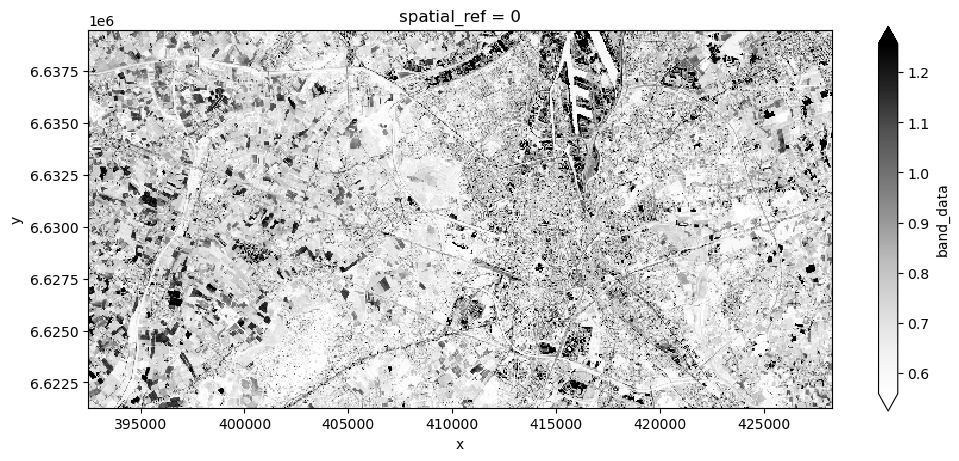

In [71]:
gent_gs = gent_f.sum(dim = 'band')

ax = gent_gs.plot.imshow(cmap = 'Greys', figsize = (12,5), robust = True)

ax.axes.set_aspect('equal')

In [ ]:
# %load _solutions/11-xarray-intro23.py
# Make a Grey scale plot
gent_f.sum(dim="band").plot.imshow(cmap="Greys", figsize=(9, 5))

<div class="alert alert-success">

**EXERCISE 8**:

The data sets `./data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff` and `./data/gent/raster/2020-09-17_Sentinel_2_L1C_B08.tiff` contain respectively the 4th and the 8th band of a sentinel satellite image. To derive the [Normalized Difference Vegetation Index) (NDVI)](https://nl.wikipedia.org/wiki/Normalized_Difference_Vegetation_Index), the two bands need to be combined as follows:
    
$$\frac{band_8 - band_4}{band_8 + band_4} $$
    
Process the images and create a plot of the NDVI:
    
- Read both data sets and store them in resp. `b4_data` and `b8_data`. 
- Transform the data range of each of the layers to the range .0 - 1.
- Calculate the NDVI
- Make a plot of the NDVI plot the data as such using the "Greens" colormap. 

__IMPROVE THE COLORMAP__
    
Using these default plot settings, the NDVI visualisation is not very informative. Actually, whereas the range is [-1, 1], values of around 0.1 and below are not considered living plants. Consider two alternative methods to improve the colormap taking into account this information:
    
1. Normalize the data linearly into the range 0.1 to 0.8 and apply this normalization to the `imshow` while using the colormap `YlGn` (so values just above 0.1 are still yellow, whereas only higher values are green). Use the Matplotlib function `mcolors.Normalize` for the data normalization.
2. To improve the contrast between vegetation versus no-vegetation, use a diverging colormap (`RdYlGn`) in combination with a [`TwoSlopeNorm`](https://matplotlib.org/stable/api/_as_gen/matplotlib.colors.TwoSlopeNorm.html) to normalize the data. Let the range vary from -0.1 till 0.8 with the center on 0.4.    

<details><summary>Hints</summary>

* For more specific adjustments to the colormap, have a check on the [Matplotlib documentation on colormap normalization](https://matplotlib.org/3.3.2/tutorials/colors/colormapnorms.html). 
* Check out the available normalization by exploring the `mcolors.` module of Matplotlib. 
* The `imshow` method can accept a `norm` parameter to normalize the data.  
* It is a two step process: 1/ define a normalization; 2/ pass the normalization to the `norm` parameter of the plot function.


</details>   
           
</div>

In [73]:
b4_data = xr.open_dataarray('data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff', engine = "rasterio", mask_and_scale = False)
b8_data = xr.open_dataarray('data/gent/raster/2020-09-17_Sentinel_2_L1C_B08.tiff', engine = "rasterio", mask_and_scale = False)

def normalize(xarray):
    x_min = xarray.min(dim = ['x', 'y'])
    x_max = xarray.max(dim = ['x', 'y'])
    return (xarray - x_min) / (x_max - x_min)

b4_norm = normalize(b4_data)
b8_norm = normalize(b8_data)

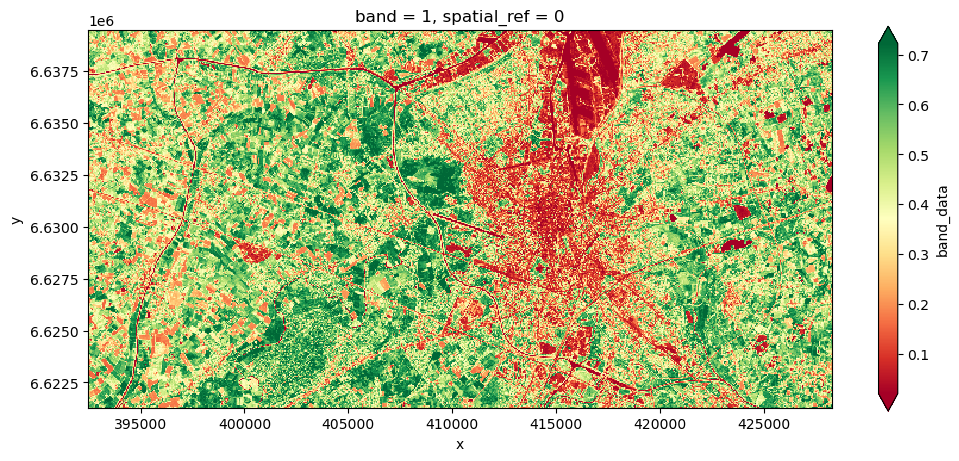

In [80]:
ndvi = (b8_norm - b4_norm) / (b8_norm + b4_norm)

f, ax = plt.subplots(figsize = (12,5))
ndvi.plot(cmap = "RdYlGn", ax = ax, robust = True)
ax.set_aspect('equal')

In [268]:
b4_data = rxr.open_rasterio('data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff')
b8_data = rxr.open_rasterio('data/gent/raster/2020-09-17_Sentinel_2_L1C_B08.tiff')

In [277]:
# def convert_and_scale(raster):
#     raster_f = raster.astype('float')
    
#     raster_f = raster_f / 65535
    
#     return raster_f

def normalize(raster):
    
    raster = raster.astype(float)
    
    return (raster - raster.min()) / (raster.max() - raster.min())

b4_data_f = normalize(b4_data)
b8_data_f = normalize(b8_data)

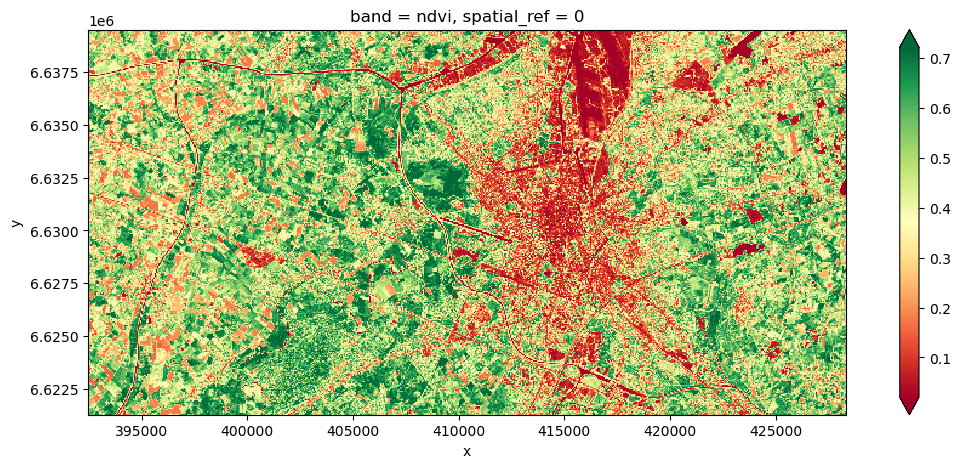

In [278]:
ndvi = (b8_data_f - b4_data_f) / (b8_data_f + b4_data_f)

# NB Does not work with inplace = True - must manually reassign
ndvi = ndvi.assign_coords(band=("band", ["ndvi"]))

ax = ndvi[0].plot.imshow(cmap = 'RdYlGn', robust = True, figsize = (14,5))
ax.axes.set_aspect('equal')

In [263]:
# %load _solutions/11-xarray-intro24.py
b4_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff", 
                            engine="rasterio", mask_and_scale=False).sel(band=1)
b8_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_B08.tiff", 
                            engine="rasterio", mask_and_scale=False).sel(band=1)

(array([1.42368e+05, 5.36160e+04, 1.69600e+03, 3.07000e+02, 6.30000e+01,
        2.80000e+01, 5.00000e+00, 4.00000e+00, 3.00000e+00, 3.50000e+01]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

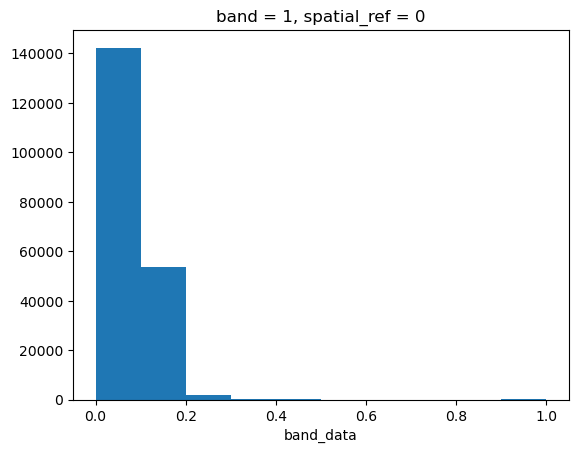

In [264]:
# %load _solutions/11-xarray-intro25.py
# Rescale the data to 0-1
b4_data = (b4_data - b4_data.min())/(b4_data.max() - b4_data.min())
b8_data = (b8_data - b8_data.min())/(b8_data.max() - b8_data.min())

b4_data.plot.hist()

In [265]:
# %load _solutions/11-xarray-intro26.py
# Calculate the ndvi
ndvi = (b8_data - b4_data)/(b8_data + b4_data)

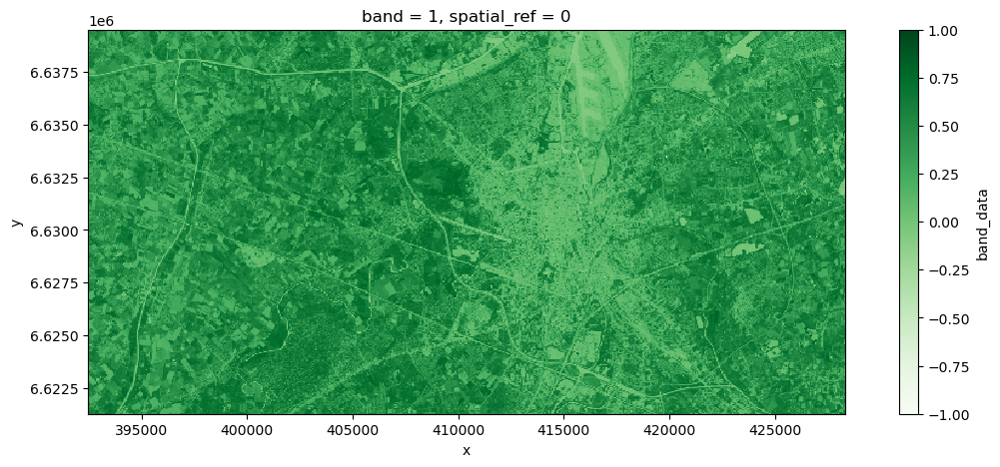

In [266]:
# %load _solutions/11-xarray-intro27.py
# As a quick reference, plot using the `"Greens"` colormap as such:
fig, ax = plt.subplots(figsize=(14, 5))
ll = ndvi.plot.imshow(ax=ax, cmap="Greens")
ax.set_aspect("equal")

In [267]:
ndvi

<xarray.DataArray 'band_data' (y: 317, x: 625)>
array([[0.55541097, 0.48813784, 0.17210779, ..., 0.46578366, 0.40432598,
        0.45748096],
       [0.42886378, 0.50698781, 0.5046415 , ..., 0.55407855, 0.54530095,
        0.5581515 ],
       [0.38293909, 0.50371527, 0.5535106 , ..., 0.59598584, 0.58643251,
        0.62915396],
       ...,
       [0.57524964, 0.54699581, 0.62176363, ..., 0.27087528, 0.48637406,
        0.63795195],
       [0.60114281, 0.61600067, 0.62748996, ..., 0.48922162, 0.49313521,
        0.72751249],
       [0.60678168, 0.53669486, 0.56684468, ..., 0.70420497, 0.66733   ,
        0.63534578]])
Coordinates:
    band         int32 1
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 0

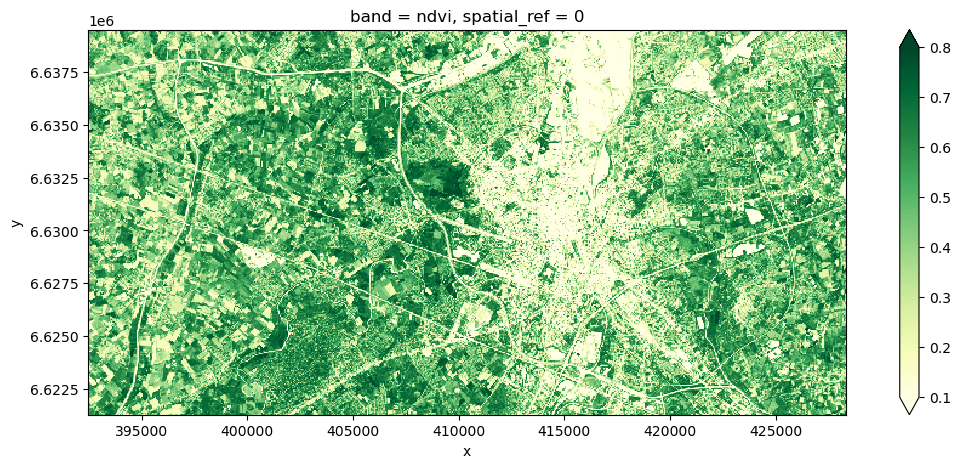

In [272]:
# %load _solutions/11-xarray-intro28.py
# A sequential colormap `YlGn` using a Matplotlib norm to adjust colormap influence on image 
# https://matplotlib.org/stable/tutorials/colors/colormapnorms.html
import matplotlib.colors as mcolors

fig, ax = plt.subplots(figsize=(14, 5))

div_norm = mcolors.Normalize(0.1, 0.8)
ll = ndvi[0].plot.imshow(ax=ax, cmap="YlGn", norm=div_norm)
ax.set_aspect("equal")

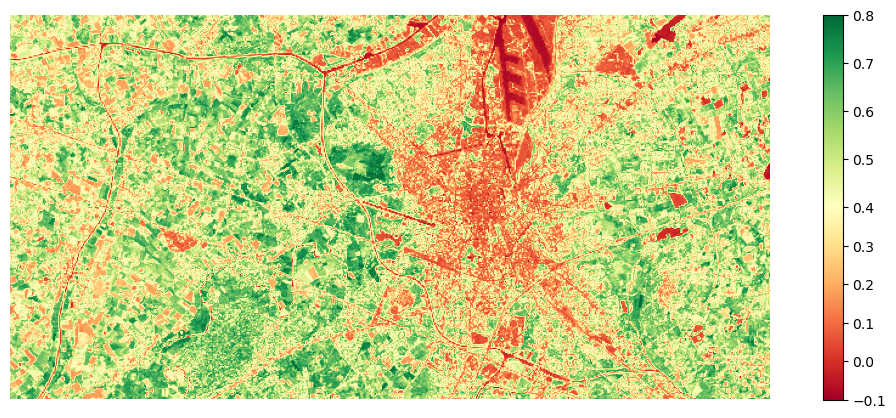

In [273]:
# %load _solutions/11-xarray-intro29.py
# A Diverging colormap `RdYlGn` with a normalization on the color limits in two directions of the central point - 
# https://matplotlib.org/stable/api/_as_gen/matplotlib.colors.TwoSlopeNorm.html
fig, ax = plt.subplots(figsize=(14, 5))

div_norm = mcolors.TwoSlopeNorm(vmin=-0.1, vcenter=0.4, vmax=0.8)

# ax.imshow automatically interpolates as nearest, smoothening out the image
ll = ax.imshow(ndvi.values[0], cmap="RdYlGn", norm=div_norm)
fig.colorbar(ll);
ax.set_axis_off();

<div class="alert alert-success">

**(ADVANCED) EXERCISE 9**:
    
You want to reclassify the values of the 4th band data to a fixed set of classes:
    
* x < 0.05 need to be 0
* 0.05 < x < 0.1 need to be 1
* x > 0.1 need to be 2
       
Use the data set `./data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff` (assign data to variable `b4_data`):
    
* Read the data set and exclude the single-value dimension to end up with a 2D array. 
* Convert to float data type and normalize the values to the range `[0., 1.]`.

To reclassify the values, we can use the `np.digitize` function. This function return the indices of the bins to which each value in input array belongs. As such, it can be used to select and manipulate values containing to a specific bin.
    
* Apply the `np.digitize` function to `b4_data` using the `xr.apply_ufunc()` function. The first argument is the function to apply, the following arguments are the arguments that would be passed to the function (`np.digitize`). Call the result `b4_data_classified`.
* Make a image plot of the reclassified variable `b4_data_classified`.
    

<details><summary>Hints</summary>

* The `apply_ufunc` function requires as input another function (in this case `np.digitize`) and is a way to use [external functionalities within xarray](http://xarray.pydata.org/en/stable/user-guide/computation.html#wrapping-custom-computation).   
* The `np.digitize` function would have as inputs the data `b4_data` and the bins to split the data, `[0.05, 0.1]`.

</details>   
    
    
</div>

In [87]:
b4_data = xr.open_dataarray("./data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff", 
                            engine="rasterio", mask_and_scale=False)

In [276]:
b4_data = rxr.open_rasterio("./data/gent/raster/2020-09-17_Sentinel_2_L1C_B04.tiff")

# Convert to 2D array
b4_data = b4_data[0]

In [82]:
b4_data_f = normalize(b4_data)

In [83]:
b4_data_f

<xarray.DataArray 'band_data' (band: 1, y: 317, x: 625)>
array([[[0.07820249, 0.08839551, 0.17509728, ..., 0.10339513,
         0.10400549, 0.08639658],
        [0.10220493, 0.07589837, 0.0854963 , ..., 0.07319753,
         0.06570535, 0.06550698],
        [0.10110628, 0.08000305, 0.07699702, ..., 0.06880293,
         0.07330434, 0.07049668],
        ...,
        [0.07269398, 0.07420462, 0.06810101, ..., 0.14090181,
         0.1008011 , 0.06829938],
        [0.07029831, 0.06950484, 0.06720073, ..., 0.0733959 ,
         0.08900587, 0.05990692],
        [0.07060349, 0.07479973, 0.07240406, ..., 0.05769436,
         0.06759747, 0.08299382]]])
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 3.925e+05 3.926e+05 ... 4.282e+05 4.283e+05
  * y            (y) float64 6.639e+06 6.639e+06 ... 6.621e+06 6.621e+06
    spatial_ref  int32 0

**(ADVANCED) EXERCISE 9**:
    
You want to reclassify the values of the 4th band data to a fixed set of classes:
    
* x < 0.05 need to be 0
* 0.05 < x < 0.1 need to be 1
* x > 0.1 need to be 2

In [281]:
# note that this is incorrect, since it returns you a numpy array, NOT an xarray
b4_data_c = np.digitize(b4_data_f, [0.05, 0.1])

b4_data_c

array([[1, 1, 2, ..., 2, 2, 1],
       [2, 1, 1, ..., 1, 1, 1],
       [2, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 2, 2, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=int64)

In [88]:
import numpy as np

# Instead, you will need to use apply_ufunc
# apply_ufunc(func_name, *args, **kwargs)
b4_data_c = xr.apply_ufunc(np.digitize, b4_data_f[0], [0.05, 0.1])

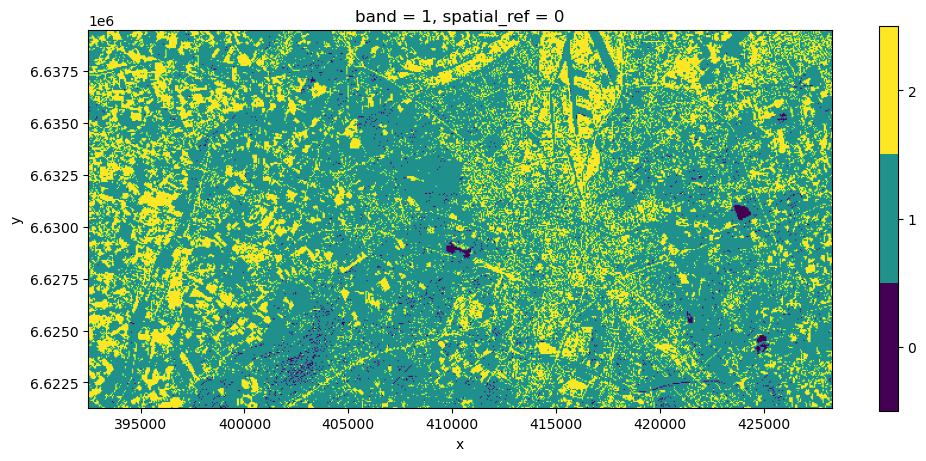

In [89]:
fig, ax = plt.subplots(figsize=(12, 5))
img = b4_data_c.plot.imshow(interpolation="antialiased", add_colorbar = False, ax = ax)

# Note that this is how you would create "middle ticks"
fig.colorbar(img, values = [0,1,2], ticks = [0,1,2])
ax.set_aspect('equal')

In [ ]:
# %load _solutions/11-xarray-intro30.py

In [ ]:
# %load _solutions/11-xarray-intro31.py

In [ ]:
# %load _solutions/11-xarray-intro32.py

In [ ]:
# %load _solutions/11-xarray-intro33.py
# Create an image plot
fig, ax = plt.subplots(figsize=(12, 5))
img = b4_data_classified.plot.imshow(ax=ax, add_colorbar=False, interpolation="antialiased")
fig.colorbar(img, values=[0, 1, 2], ticks=[0, 1, 2])

<div class="alert alert-info">
    
__Note:__
    
When only interested in a discrete colormap for plotting instead of the data manipulation, xarray provides the `levels` parameter whe plotting, see http://xarray.pydata.org/en/stable/user-guide/plotting.html#discrete-colormaps.    
    
</div>